<a href="https://colab.research.google.com/github/Amtallanekesa/Data-Science-and-Machine-Learning-projects/blob/main/A_N_Fake_news_detection_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install wordcloud


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nltk
import sklearn
import re
from wordcloud import WordCloud

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [ ]:
#Explore the fake news dataset
fake=pd.read_csv(r'file:///C:\Users\user\AppData\Local\Temp\55a2e954-304a-4e0e-b906-0a61c3adbe43_Fake.csv.zip.e43\Fake.csv')

In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
#check how many subjects we have for the fake news
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

In [ ]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import seaborn as sns

<Axes: xlabel='subject', ylabel='count'>

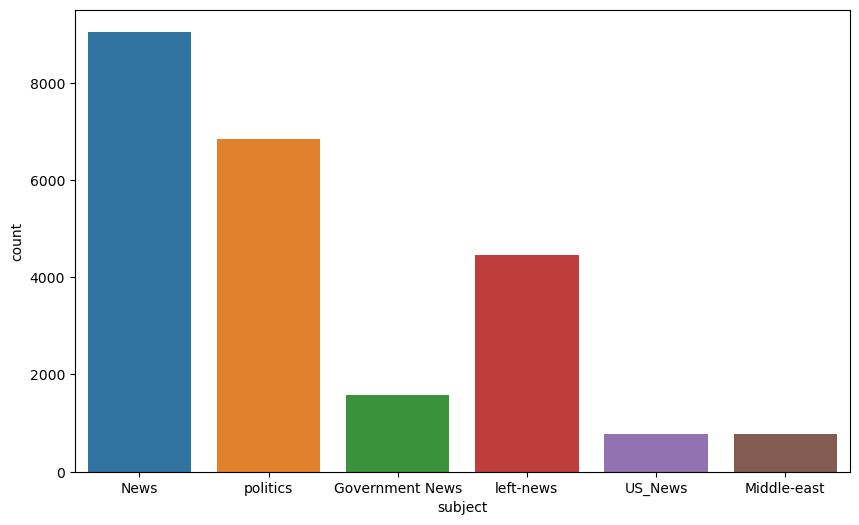

In [ ]:
#you can go ahead and plot the data above
plt.figure(figsize=(10,6))
sns.countplot(x='subject',data=fake)

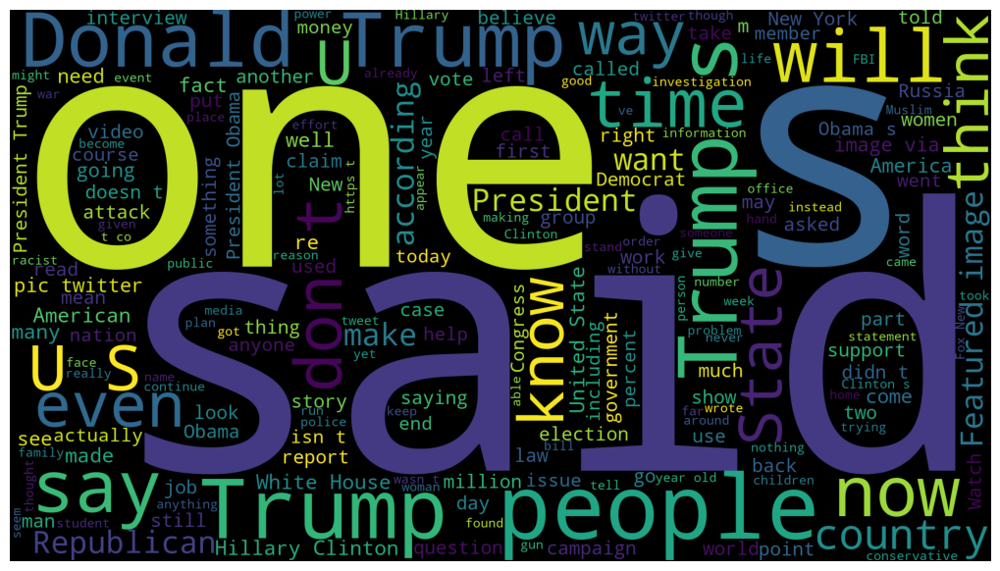

In [ ]:
#now go ahead and use wordcloud to visualize text data
#convert all the fake test that was a series into a list
fake['text'].tolist()
#we need a single text data to feed the data into wordcloud. You are basically joining all the data and the spaces.
text=''.join(fake['text'].tolist())
#keep all the variables as it is and plot
wordcloud=WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#now go ahead and explore the real news dataset
real=pd.read_csv(r'file:///C:\Users\user\AppData\Local\Temp\5d3af9e8-9ee3-42a4-89a5-ae8a55349ebd_True.csv.zip.ebd\True.csv')

In [ ]:
#once again, put all the textdata together
text=''.join(real['text'].tolist())

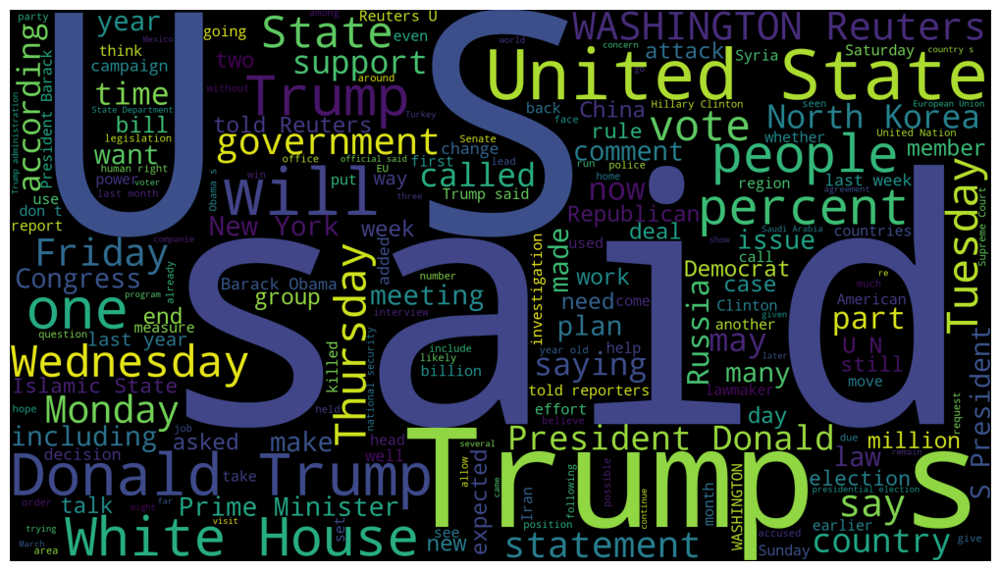

In [ ]:
wordcloud=WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#A few differences that have been noted in the text
 #1.The real news has the source of publication while the fake news does not
 #2. Some text are tweets from twitter
 #3. Few text do not contain any publication information
#Now proceed to clean the data
  #1. Remove reuters information from our real data
  #2. Remove the twitter tweet information from the text
#create a list of indexes that do not have publication information
unknown_publishers=[]
for index,row in enumerate (real.text.values):
    try:
        record=row.split('-',maxsplit=1)
        record[1]
        assert(len(record[0])<120)
    except:
            unknown_publishers.append(index)


In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
len(unknown_publishers)

222

In [ ]:
#check the data of the unknown publishers
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [ ]:
publisher= []
tmp_text= []

for index, row in enumerate(real.text.values):
    if index in unknown_publishers:
        tmp_text.append(row)
        publisher.append('unknown')

    else:
            record= row.split('-',maxsplit=1)
            publisher.append(record[0].strip())
            tmp_text.append(record[1].strip())

In [ ]:
real['publisher']=publisher
real['text']=tmp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [ ]:
real.shape

(21417, 5)

In [ ]:
#check whether there is empty text in the fake dataset. check if the string is a text and use strip to remove the whitespaces
empty_fake_index=[index for index, text in enumerate(fake.text.tolist())if str(text).strip()==""]

In [ ]:
#now go ahead and get th fake data
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
real['text']=real['title']+""+real['text']
fake['text']=fake['title']+""+fake['text']

In [ ]:
#now preprocess the text
real['class']=1
fake['class']=0

In [ ]:
real=real[['text','class']]
fake=fake[['text','class']]

In [ ]:
#append the fake dataset to the real one while ignoring indexes
data=real.append(fake,ignore_index=True)

C:\Users\user\AppData\Local\Temp\ipykernel_10904\2427657398.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data=real.append(fake,ignore_index=True)


In [ ]:
#get a sample of the data to see what it looks like
data.sample(5)

,text,class
20276,Graveyard killing of Belgian mayor was 'reveng...,1
6051,Trump says to host India's Modi for U.S. visit...,1
26995,WATCH: Hillary RUINS Trump Right Outside His ...,0
3579,"Leaks of Manchester bomb probe 'reprehensible,...",1
5468,Text of Michael Flynn's letter resigning as na...,1


In [ ]:
#install kgp talkie preprocess package
!pip install spacy
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4
!pip install textblob

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     --------------------------------------- 0.1/12.8 MB 512.0 kB/s eta 0:00:25
     --------------------------------------- 0.1/12.8 MB 547.6 kB/s eta 0:00:24
     --------------------------------------- 0.1/12.8 MB 532.5 kB/s eta 0:00:24
     --------------------------------------- 0.2/12.8 MB 579.6 kB/s eta 0:00:22
      -------------------------------------- 0.2/12.8 MB 593.2 kB/s eta 0:00:22
      -------------------------------------- 0.2/12.8 MB 600.7 kB/s eta 0:00:21
      -------------------------------------- 0.3/12.8 MB 606.6 kB/s eta 0:00:21
      -------------------------------------- 0.3/12.8 MB 655.5 kB/s eta 0:00:20
      -------------------------------------- 0.3/12.8 MB 634.7 kB/s eta 0:00:20
     - ------------------------------------- 0.4/12.8 MB 637.7 k

In [ ]:
#if you use git from the web and you do not want to install it, you can download the repository zip file and install from the package from the zip file
!pip install C:\Users\user\Downloads\preprocess_kgptalkie-master.zip --upgrade --force-reinstall

Processing c:\users\user\downloads\preprocess_kgptalkie-master.zip
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for preprocess-kgptalkie: filename=preprocess_kgptalkie-0.1.3-py3-none-any.whl size=7624 sha256=0ceb5c6c984fc25565db4584851d53d769e1471939da8e5173fd7283c1ead77a
  Stored in directory: c:\users\user\appdata\local\pip\cache\wheels\01\db\1a\2bef05efd7afb5158db40d56b6efc1fba54a4467cea51d2f60
Successfully built preprocess-kgptalkie
  Attempting uninstall: preprocess-kgptalkie
    Found existing installation: preprocess-kgptalkie 0.1.3
    Uninstalling preprocess-kgptalkie-0.1.3:
      Successfully uninstalled preprocess-kgptalkie-0.1.3


In [ ]:
import preprocess_kgptalkie as ps

In [ ]:
data['text']=data['text'].apply(lambda x:ps.remove_special_chars(x))

In [ ]:
#Vectorization
import gensim

In [ ]:
#create a list and convert everything into a list of list
y=data['class'].values

In [ ]:
#use the list comprehension method.Do a for loop
X=[d.split()for d in data['text'].tolist()]

In [ ]:
type(X[0])

list

In [ ]:
X[0]

['As',
 'US',
 'budget',
 'fight',
 'looms',
 'Republicans',
 'flip',
 'their',
 'fiscal',
 'scriptThe',
 'head',
 'of',
 'a',
 'conservative',
 'Republican',
 'faction',
 'in',
 'the',
 'US',
 'Congress',
 'who',
 'voted',
 'this',
 'month',
 'for',
 'a',
 'huge',
 'expansion',
 'of',
 'the',
 'national',
 'debt',
 'to',
 'pay',
 'for',
 'tax',
 'cuts',
 'called',
 'himself',
 'a',
 'fiscal',
 'conservative',
 'on',
 'Sunday',
 'and',
 'urged',
 'budget',
 'restraint',
 'in',
 '2018',
 'In',
 'keeping',
 'with',
 'a',
 'sharp',
 'pivot',
 'under',
 'way',
 'among',
 'Republicans',
 'US',
 'Representative',
 'Mark',
 'Meadows',
 'speaking',
 'on',
 'CBS',
 'Face',
 'the',
 'Nation',
 'drew',
 'a',
 'hard',
 'line',
 'on',
 'federal',
 'spending',
 'which',
 'lawmakers',
 'are',
 'bracing',
 'to',
 'do',
 'battle',
 'over',
 'in',
 'January',
 'When',
 'they',
 'return',
 'from',
 'the',
 'holidays',
 'on',
 'Wednesday',
 'lawmakers',
 'will',
 'begin',
 'trying',
 'to',
 'pass',
 'a',


In [ ]:
#convert each of the words into a sequence of 100 vectors
DIM= 100
w2v_model=gensim.models.Word2Vec(sentences=X, vector_size=DIM, window=10, min_count=1)

In [ ]:
len(w2v_model.wv.index_to_key)

289175

In [ ]:
w2v_model.wv['love']

array([ 0.14461137, -0.47028574,  1.5413736 , -0.12863632,  3.1735382 ,
        0.13062395, -4.0484242 , -1.7399849 , -2.028712  , -1.5014976 ,
        1.5742251 , -0.39353746, -0.12102297,  1.9318686 ,  3.928037  ,
        1.2188306 , -0.9123532 , -0.636125  , -2.0578754 , -3.7569065 ,
        1.8146102 , -1.8750457 ,  2.3202884 , -1.127121  ,  0.07019363,
       -1.3684679 ,  2.3140323 , -1.0640186 ,  1.2020968 , -2.3961997 ,
       -0.22571875,  1.1008832 , -1.5192565 ,  1.797451  , -0.02883393,
        3.9946208 , -1.2604326 ,  2.6648173 , -3.441004  , -0.9352237 ,
        1.9588828 ,  2.2001414 , -0.0644393 ,  0.56403214,  0.4566154 ,
        1.7166026 ,  0.96108043, -1.6817914 ,  0.72965646, -1.9673656 ,
        2.7814124 ,  1.3677478 ,  5.749693  ,  1.3671459 , -2.0365865 ,
        0.30328426,  2.2445142 ,  3.3311594 ,  0.4893846 , -4.656166  ,
        5.390275  , -0.19891721,  1.6188462 , -0.22598512, -0.42563617,
       -1.3823842 ,  0.81337065, -0.39009032, -2.299676  ,  0.78

In [ ]:
#you can also use the most_similar() method to find the words that are most similar to trump for example
w2v_model.wv.most_similar(['trump'])

[('TrumpFeatured', 0.5826833844184875),
 ('america', 0.5627214312553406),
 ('MAGA', 0.5555230975151062),
 ('Kalb', 0.5519920587539673),
 ('u', 0.5348352789878845),
 ('2016realDonaldTrump', 0.5279632806777954),
 ('2016Trump', 0.5234999656677246),
 ('MBGlenn', 0.5130957365036011),
 ('Zarrabrelated', 0.5104132890701294),
 ('Sorry', 0.5078867077827454)]

In [ ]:
#now train the machine learning model using the method that gives higher accuracy
#tokenizaion
tokenizer= Tokenizer()
tokenizer.fit_on_texts(X)


In [ ]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
#tokenizer.word_index

In [ ]:
#check how many words are present in each row
[len(x)for x in X]

[752,
 627,
 463,
 381,
 859,
 598,
 542,
 136,
 100,
 73,
 403,
 622,
 101,
 185,
 359,
 449,
 695,
 178,
 393,
 217,
 526,
 909,
 414,
 363,
 692,
 374,
 349,
 267,
 74,
 433,
 176,
 227,
 94,
 336,
 1109,
 838,
 553,
 468,
 465,
 98,
 177,
 323,
 581,
 71,
 408,
 364,
 616,
 357,
 84,
 402,
 80,
 961,
 655,
 417,
 398,
 383,
 219,
 161,
 388,
 615,
 488,
 243,
 848,
 369,
 627,
 648,
 1299,
 430,
 397,
 141,
 211,
 1107,
 74,
 73,
 587,
 849,
 757,
 787,
 346,
 693,
 481,
 415,
 83,
 418,
 126,
 1382,
 99,
 457,
 357,
 84,
 61,
 107,
 655,
 348,
 227,
 79,
 321,
 426,
 346,
 560,
 414,
 853,
 91,
 332,
 135,
 197,
 407,
 90,
 1123,
 994,
 385,
 114,
 72,
 436,
 597,
 87,
 79,
 637,
 251,
 253,
 312,
 201,
 160,
 291,
 391,
 427,
 400,
 716,
 617,
 281,
 103,
 86,
 84,
 78,
 73,
 508,
 406,
 248,
 722,
 766,
 230,
 419,
 432,
 544,
 419,
 364,
 309,
 830,
 685,
 88,
 98,
 107,
 359,
 86,
 57,
 294,
 225,
 284,
 369,
 107,
 461,
 579,
 942,
 1066,
 262,
 461,
 463,
 498,
 88,
 533,
 1

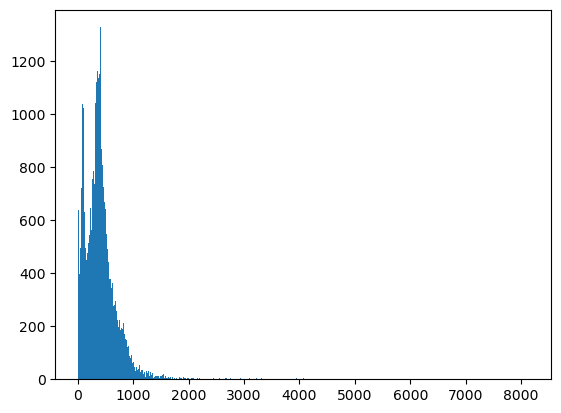

In [ ]:
plt.hist([len(x)for x in X],bins=700)
plt.show()

In [ ]:
nos=np.array([len(x)for x in X])
len(nos[nos>1000])

1579

In [ ]:
maxlen=1000
X= pad_sequences(X, maxlen=maxlen)

In [ ]:
len(x[101])

1000

In [ ]:
#for the uknown words, add 1 to the length
vocab_size=len(tokenizer.word_index)+1
vocab=tokenizer.word_index

In [ ]:
#feed the vector into the model
def get_weight_matrix(model):
    weight_matrix = np.zeros((vocab_size, DIM))
    for word, i in vocab.items():
        if word in model.wv:
            weight_matrix[i] = model.wv[word]
        else:
            print(f"Word '{word}' not present in the model's vocabulary.")
    return weight_matrix



In [ ]:
embedding_vectors=get_weight_matrix(w2v_model)

Word 'tuesday' not present in the model's vocabulary.
Word 'wednesday' not present in the model's vocabulary.
Word 'friday' not present in the model's vocabulary.
Word 'korea' not present in the model's vocabulary.
Word 'york' not present in the model's vocabulary.
Word 'iran' not present in the model's vocabulary.
Word 'january' not present in the model's vocabulary.
Word 'june' not present in the model's vocabulary.
Word 'syrian' not present in the model's vocabulary.
Word 'iraq' not present in the model's vocabulary.
Word 'putin' not present in the model's vocabulary.
Word 'saturday' not present in the model's vocabulary.
Word 'november' not present in the model's vocabulary.
Word 'mexico' not present in the model's vocabulary.
Word 'saudi' not present in the model's vocabulary.
Word 'comey' not present in the model's vocabulary.
Word 'israel' not present in the model's vocabulary.
Word 'december' not present in the model's vocabulary.
Word 'october' not present in the model's vocab

In [ ]:
embedding_vectors.shape

(252894, 100)

In [ ]:
#compile the model
model= Sequential()
model.add(Embedding(vocab_size,output_dim=DIM, weights=[embedding_vectors], input_length=maxlen,trainable=True))
model.add(LSTM(units=128))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 1000, 100)         25289400  
                                                                 
 lstm_2 (LSTM)               (None, 128)               117248    
                                                                 
 dense_2 (Dense)             (None, 1)                 129       
                                                                 
Total params: 25406777 (96.92 MB)
Trainable params: 25406777 (96.92 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
X_train, X_test,y_train,y_test=train_test_split(X,y)

In [ ]:
(model.fit(X_train,y_train,validation_split=0.3,epochs=6)

In [ ]:
y_pred=(model.predict(X_test>=0.5).astype(int))

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
print(classification_report(y_test,y_pred))